In [1]:
## why is the validation_accuracy not changing in training ????????????????????????
## the padding was too high : changed it form 500 to 100 
## add more data !!!!!!!!!!!!
## 50 epoches is good but maybe try more
## remove unknown data from training and set a high threashold ? didn't work
## maybe try add more unknown data

## None in input 
# Using None in the input shape of a model, specifically in frameworks like TensorFlow/Keras, 
# allows for flexibility in the sequence length of the input data. This is particularly useful 
# when dealing with time series data, such as audio signals, where the length of the sequences can vary

In [2]:
# # voice input shape
# Time Steps and Features: Unlike images with height, width, and channels, voice data is typically represented as a sequence of features extracted over time. The input shape for voice data often consists of two dimensions:

# Time Steps: The number of time steps or frames in the audio sample. Each time step corresponds to a small segment of the audio waveform.
# Features: The number of features extracted from each time step. Common features for voice data include Mel-frequency cepstral coefficients (MFCCs), spectral features, or other representations obtained from audio signal processing techniques.

In [3]:
import librosa
import numpy as np

def extract_features(file_path):
    y, sr = librosa.load(file_path, sr=None)
    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)# 13 = refers to the number of extracted features
    return mfcc.T  # Transpose to have time steps first

# Example usage
# features = extract_features('path_to_audio_file.wav')

In [4]:
import os
import numpy as np
from keras.preprocessing.sequence import pad_sequences
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split

def extract_features_and_labels(data_path):
    # Initialize lists to hold features and labels
    features_list = []
    labels_list = []

    # Iterate through each file in the dataset directory
    for file_name in os.listdir(data_path):
        if file_name.endswith('.wav'):
            file_path = os.path.join(data_path, file_name)
            features = extract_features(file_path)
            features_list.append(features)

            # Assuming the file name format is 'speaker_label_audioID.wav'
            label = file_name.split('_')[0]
            labels_list.append(label)

    return features_list, labels_list


# train_data_path = '/content/drive/MyDrive/speech_recognition/dataset/speech_train'
# features_train, labels_train = extract_features_and_labels(train_data_path)

# test_data_path = '/content/drive/MyDrive/speech_recognition/dataset/speech_test'
# features_test, labels_test = extract_features_and_labels(test_data_path)

# using test_train_split
features, labels = extract_features_and_labels('speech_dataset')
print(labels)
# Split the data into training and testing sets
features_train, features_test, labels_train, labels_test = train_test_split(
    features, labels, test_size=0.2, random_state=12, stratify=labels
)

# The stratify parameter in train_test_split from sklearn.model_selection is used to ensure that the
# training and testing sets maintain the same proportion of classes as the original dataset.

# Padding sequences to ensure they have the same length
max_length = 100
features_train_padded = pad_sequences(features_train, maxlen=max_length, padding='post', dtype='float32')
features_test_padded = pad_sequences(features_test, maxlen=max_length, padding='post', dtype='float32')

# Encode labels to numerical classes
label_encoder = LabelEncoder()
labels_train_encoded = label_encoder.fit_transform(labels_train)
labels_test_encoded = label_encoder.transform(labels_test)

# One-hot encode the labels
labels_train_one_hot = to_categorical(labels_train_encoded)
labels_test_one_hot = to_categorical(labels_test_encoded)

# Get the list of classes (unique speakers)
classes = label_encoder.classes_

['gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 'gates', 

In [5]:
features

[array([[-8.57814453e+02,  7.33313141e+01,  2.22950630e+01,
          1.62436104e+01,  2.00730495e+01,  1.92820473e+01,
          1.51347666e+01,  1.46579151e+01,  1.11358881e+01,
          1.49248981e+01,  1.23795977e+01,  1.21572876e+01,
          1.08379707e+01],
        [-8.34446411e+02,  6.42982407e+01,  2.80377369e+01,
          2.47227936e+01,  2.24241524e+01,  1.87322769e+01,
          1.78610096e+01,  1.70093498e+01,  8.05578136e+00,
          9.22842789e+00,  8.02160263e+00,  1.05363312e+01,
          1.20666409e+01],
        [-8.34728516e+02,  6.38533020e+01,  2.95857677e+01,
          1.92755699e+01,  2.13872433e+01,  1.72637215e+01,
          1.81702919e+01,  2.04448490e+01,  1.29897976e+01,
          9.80893707e+00,  8.28743362e+00,  7.95898438e+00,
          7.51144028e+00],
        [-8.34061768e+02,  6.76629181e+01,  3.23462067e+01,
          2.02690620e+01,  1.97591858e+01,  1.69447136e+01,
          1.43526306e+01,  1.80605850e+01,  1.19099646e+01,
          1.0407177

In [6]:
type(labels)

list

In [7]:
from keras.models import Sequential, Model
from keras.layers import LSTM, Dense, Dropout, Input



model = Sequential()
model.add(LSTM(128, input_shape=(max_length,13))) #, return_sequences=True
model.add(Dropout(0.2))
# model.add(LSTM(64, return_sequences=False))
# model.add(Dropout(0.2))
# model.add(Dense(128))#, activation='relu'
# model.add(Dense(32))#, activation='relu' # no activation : linear  # embeddings layer
model.add(Dense(len(classes), activation='softmax'))

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
history = model.fit(features_train_padded, labels_train_one_hot, epochs=30, batch_size=32, validation_split=0.2)



input_layer = Input(shape =(max_length, 13))

###################
# import tensorflow as tf
# Create a model that outputs the second-to-last layer of the original model to use as embeddings.
embedding_model = Model(inputs=model.layers[0].input, outputs=model.layers[-2].output)



c:\Users\laktam\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/30
45/45 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step - accuracy: 0.2242 - loss: 1.5897 - val_accuracy: 0.3056 - val_loss: 1.4816
Epoch 2/30
45/45 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.3943 - loss: 1.3297 - val_accuracy: 0.5528 - val_loss: 1.0975
Epoch 3/30
45/45 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.5582 - loss: 0.9978 - val_accuracy: 0.6250 - val_loss: 0.9138
Epoch 4/30
45/45 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - accuracy: 0.7014 - loss: 0.8203 - val_accuracy: 0.7750 - val_loss: 0.6522
Epoch 5/30
45/45 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - accuracy: 0.8173 - loss: 0.5396 - val_accuracy: 0.8111 - val_loss: 0.5433
Epoch 6/30
45/45 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - accuracy: 0.8358 - loss: 0.4738 - val_accuracy: 0.7583 - val_loss: 0.6773
Epoch 7/30
45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step - accuracy: 0.8181 - loss: 0.5221 - val_accuracy: 0.8972 - val_loss: 0.3309
Epoch 8/30
45/45 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.8492 - loss: 0.4712 - val_accuracy: 0.8806 - v

In [8]:
print("Model input shape:", model.input_shape)
print("Model input shape:", embedding_model.input_shape)
print(model.summary())
print(embedding_model.summary())


Model input shape: (None, 100, 13)
Model input shape: (None, 100, 13)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 128)            │        72,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 220,049 (859.57 KB)

 Trainable params: 73,349 (286.52 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 146,700 (573.05 KB)

None


Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 100, 13)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 128)            │        72,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 72,704 (284.00 KB)

 Trainable params: 72,704 (284.00 KB)

 Non-trainable params: 0 (0.00 B)

None


In [9]:
## creating embeddings dataset
embeddings_train = embedding_model.predict(features_train_padded)
# print(embeddings_train)
# Calculate average embeddings for each class
def calculate_average_embeddings(embeddings, labels):
    average_embeddings = {}
    unique_labels = np.unique(labels)
    for label in unique_labels:
        class_embeddings = []
        for i in range(len(labels)):
            if labels[i] == label:
                class_embeddings.append(embeddings[i])
        class_embeddings = np.array(class_embeddings)
        average_embedding = np.mean(class_embeddings, axis=0)
        average_embeddings[label] = average_embedding
    return average_embeddings

average_embeddings_train = calculate_average_embeddings(embeddings_train, labels_train)
average_embeddings_train

57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step


{'gates': array([ 0.08567262, -0.22874492,  0.10562336,  0.06557385, -0.09737509,
        -0.14229116, -0.3262086 ,  0.669572  , -0.33602402,  0.28973576,
         0.00590413, -0.61805564,  0.42056775, -0.13073866,  0.13733572,
         0.32018188,  0.30791318,  0.06800259,  0.12502167, -0.08653413,
         0.4886824 ,  0.16302668,  0.1981276 ,  0.5909602 ,  0.14508142,
         0.30452034,  0.18395415, -0.2209972 ,  0.00761388,  0.11013495,
        -0.31431141,  0.04698099,  0.06615652, -0.3504009 ,  0.05942675,
        -0.4412063 , -0.11112713,  0.07953206, -0.17919464,  0.22636515,
         0.27796516, -0.05105012,  0.65482295, -0.5292936 ,  0.04264821,
        -0.48195016,  0.2863337 ,  0.10184404,  0.06708168, -0.2957373 ,
         0.1688779 , -0.13114557, -0.06718332,  0.02288513, -0.5545863 ,
        -0.319464  ,  0.05388853, -0.76577544, -0.25494483, -0.47648132,
        -0.21115308,  0.20201162, -0.22921231,  0.07460082,  0.22468217,
        -0.19671358, -0.03399332, -0.20825

In [23]:
# features_ = extract_features("speech_dataset/gates_0_03_0.wav")
# f_padded =  pad_sequences(features_, maxlen=max_length, padding='post', dtype='float32')
# pred = embedding_model.predict(f_padded)
# pred
# e = embedding_model.predict(features_train_padded[0])
features_train_padded.shape

(1800, 100, 13)

In [18]:
# save the model
# embedding_model.save("speech_model.keras")
embedding_model.save("speech_embedding_model.keras")

In [12]:
# saving embeddings
import pickle

# this file store the average of the embeddings for each speacker
with open('speech_embeddings.pkl', 'wb') as f:
    pickle.dump(average_embeddings_train, f)

In [13]:
## from old file, not used  

In [14]:
loss, accuracy = model.evaluate(features_test_padded, labels_test_one_hot)
print(f'Test Accuracy: {accuracy * 100:.2f}%')


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.9768 - loss: 0.1270
Test Accuracy: 97.78%


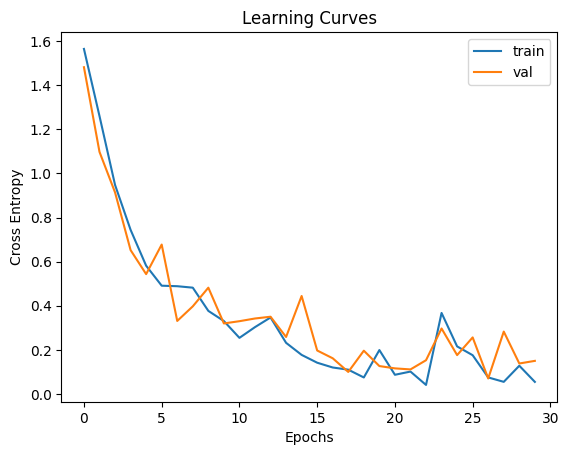

In [15]:
from matplotlib import pyplot
pyplot.title('Learning Curves')
pyplot.xlabel('Epochs')
pyplot.ylabel('Cross Entropy')
pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='val')
pyplot.legend()
pyplot.show()

In [16]:
# def predict_speaker(file_path):
#     new_features = extract_features(file_path)
#     new_features_padded = pad_sequences([new_features], maxlen=max_length, padding='post', dtype='float32')
#     # prediction = model.predict(new_features_padded)
#     # print(model.layers[-2].output)
#     prediction = embedding_model.predict(new_features_padded)
#     print(prediction)
#     # predicted_speaker = label_encoder.inverse_transform([np.argmax(prediction)])
#     # return predicted_speaker[0]

# # Example usage
# predicted_speaker = predict_speaker('test_data/sam_9_04_19.wav')
# print(f'The speaker is: {predicted_speaker}')

# predicted_speaker = predict_speaker('test_data/sam_9_04_20.wav')
# print(f'The speaker is: {predicted_speaker}')

# # 0_11_10.wav
# # sam_9_04_17.wav
# # unknown_0_08_12.wav
# # musk_9_02_17.wav
# # gates_9_03_1.wav
# # 0_44_0.wav
# # 0_52_0.wav
# # 0_58_0.wav
# # trump_9_05_43.wav
# #value that i got for unknown test :0.6,0.95,0.95